# Florence 2 for video segmentation (SAM2.1 is better)

In [1]:
#https://huggingface.co/microsoft/Florence-2-large/blob/main/sample_inference.ipynb
#https://towardsdatascience.com/florence-2-mastering-multiple-vision-tasks-with-a-single-vlm-model-435d251976d0
#https://huggingface.co/microsoft/Florence-2-large

In [2]:
import requests
import torch
from PIL import Image, ImageDraw
from transformers import AutoProcessor, AutoModelForCausalLM 
import random
import numpy as np
import os
from tqdm.notebook import tqdm
import cv2

2025-01-28 09:43:10.321877: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738057390.332914     600 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738057390.336428     600 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-28 09:43:10.348456: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
input_path = "/workspace/"
input_video_name=input_path+'original_video.mp4' #This will be split into frames
output_video_name='output_video_florence2.mp4' #This is the output video
save_path='workspace/output_video_florence2/' #This is where the output frame and video will be saved

if not os.path.exists(save_path):
    os.makedirs(save_path)

In [4]:
def extract_frames(video_path, output_path=save_path):
    # Create output directory if it doesn't exist
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    
    # Open the video file
    video = cv2.VideoCapture(video_path)
    
    # Get video properties
    fps = video.get(cv2.CAP_PROP_FPS)
    frame_count = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Initialize frame counter
    count = 0
    
    print(f"Extracting frames from video...")
    print(f"Total frames: {frame_count}")
    
    # Read and save frames
    while video.isOpened():
        ret, frame = video.read()
        
        if not ret:
            break
            
        # Save frame as JPEG file
        frame_path = os.path.join(output_path, f'frame_{count:04d}.jpg')
        cv2.imwrite(frame_path, frame)
        
        count += 1
        
        # Print progress
        if count % 100 == 0:
            print(f"Processed {count} frames...")
    
    # Release video capture object
    video.release()
    
    print(f"Extraction complete. {count} frames saved to {output_path}")

# Example usage:
extract_frames(input_video_name)

Extracting frames from video...
Total frames: 602
Processed 100 frames...
Processed 200 frames...
Processed 300 frames...
Processed 400 frames...
Processed 500 frames...
Processed 600 frames...
Extraction complete. 602 frames saved to workspace/output_video_florence2/


In [5]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large", torch_dtype=torch_dtype, trust_remote_code=True).to(device)
processor = AutoProcessor.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)

def run_example(task_prompt, max_tokens=1024, num_beams=3, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt").to(device, torch_dtype)
    generated_ids = model.generate(
      input_ids=inputs["input_ids"],
      pixel_values=inputs["pixel_values"],
      max_new_tokens=max_tokens,
      num_beams=num_beams
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    parsed_answer = processor.post_process_generation(generated_text, task=task_prompt, image_size=(image.width, image.height))

    return parsed_answer

config.json:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
/workspace/myenv/lib/python3.11/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


pytorch_model.bin:   0%|          | 0.00/1.56G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/48.7k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

/workspace/myenv/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [6]:
colormap = ['blue','orange','green','purple','brown','pink','gray','olive','cyan','red',
            'lime','indigo','violet','aqua','magenta','coral','gold','tan','skyblue']

def draw_polygons(image, prediction, save_path, fill_mask=False):  
    """  
    Draws segmentation masks with polygons on an image.  
  
    Parameters:  
    - image_path: Path to the image file.  
    - prediction: Dictionary containing 'polygons' and 'labels' keys.  
                  'polygons' is a list of lists, each containing vertices of a polygon.  
                  'labels' is a list of labels corresponding to each polygon.  
    - fill_mask: Boolean indicating whether to fill the polygons with color.  
    """  
    # Load the image  
   
    draw = ImageDraw.Draw(image)  
   
    # Set up scale factor if needed (use 1 if not scaling)  
    scale = 1  
      
    # Iterate over polygons and labels  
    for polygons, label in zip(prediction['polygons'], prediction['labels']):  
        color = random.choice(colormap)  
        fill_color = random.choice(colormap) if fill_mask else None  
          
        for _polygon in polygons:  
            _polygon = np.array(_polygon).reshape(-1, 2)  
            if len(_polygon) < 3:  
                print('Invalid polygon:', _polygon)  
                continue  
              
            _polygon = (_polygon * scale).reshape(-1).tolist()  
              
            # Draw the polygon  
            if fill_mask:  
                draw.polygon(_polygon, outline=color, fill=fill_color)  
            else:  
                draw.polygon(_polygon, outline=color)  
              
            # Draw the label text  
            draw.text((_polygon[0] + 8, _polygon[1] + 2), label, fill=color)  
  
    # Save or display the image  
    # display(image)

    #Save the image
    image.save(save_path)

    return image

Processing frames:   0%|          | 0/603 [00:00<?, ?it/s]

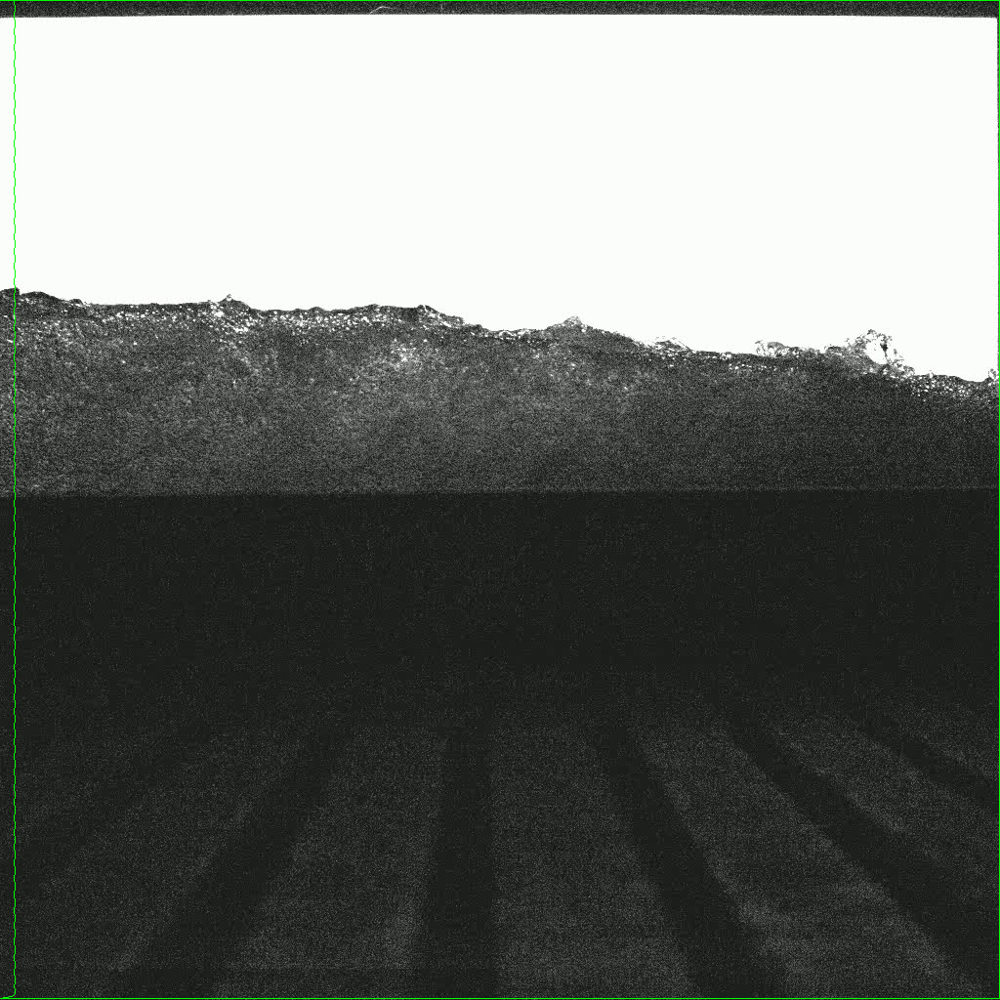

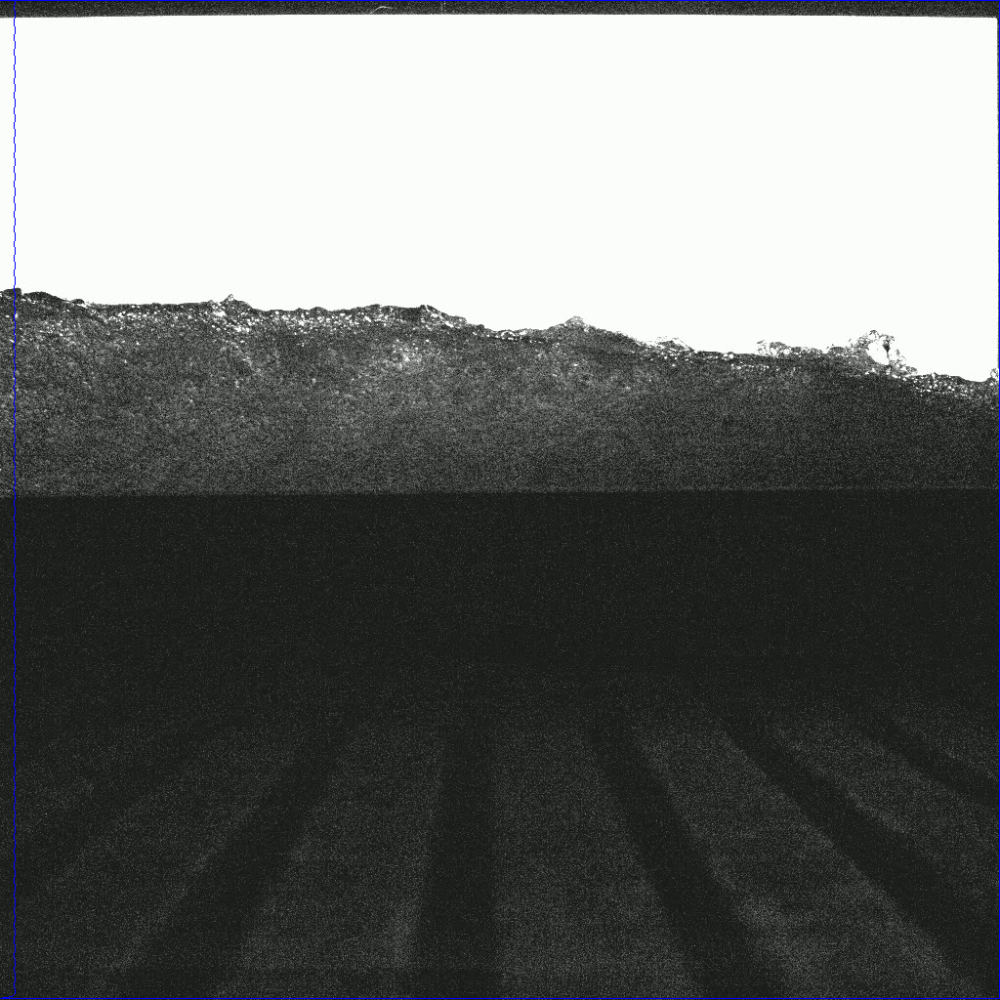

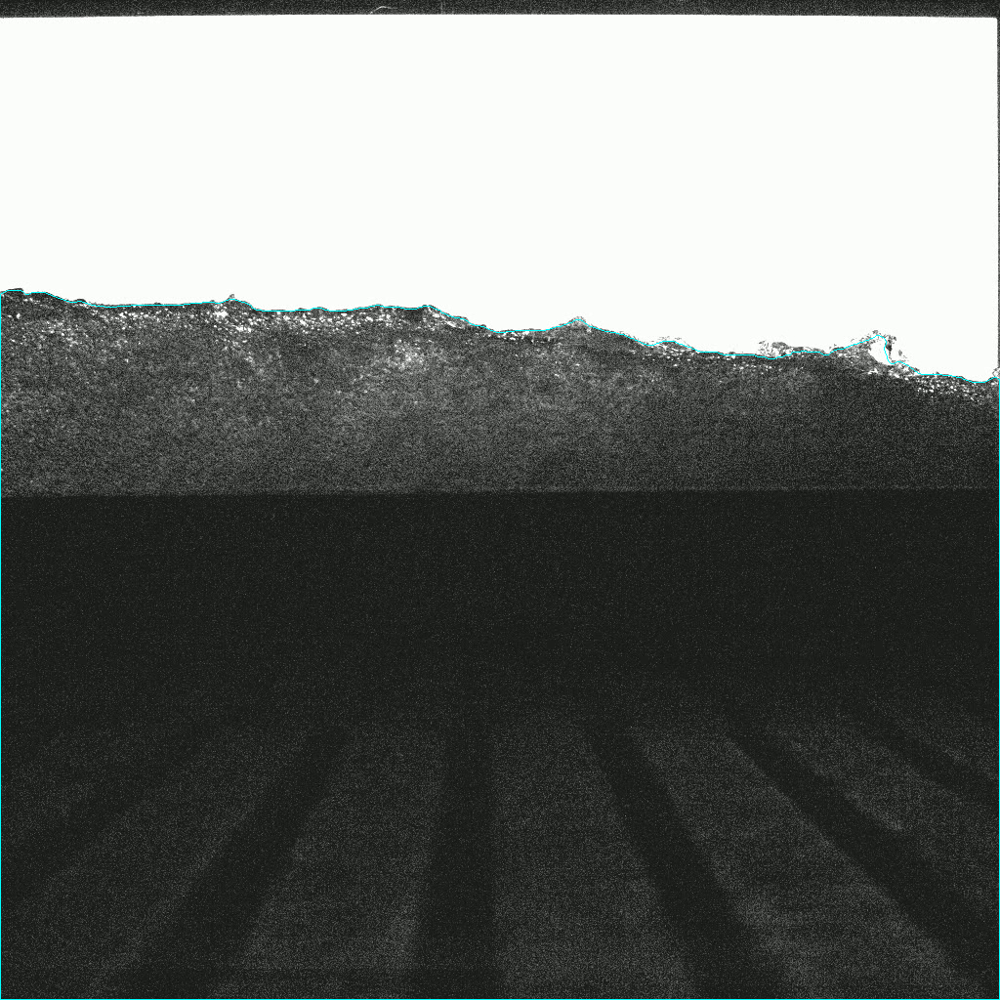

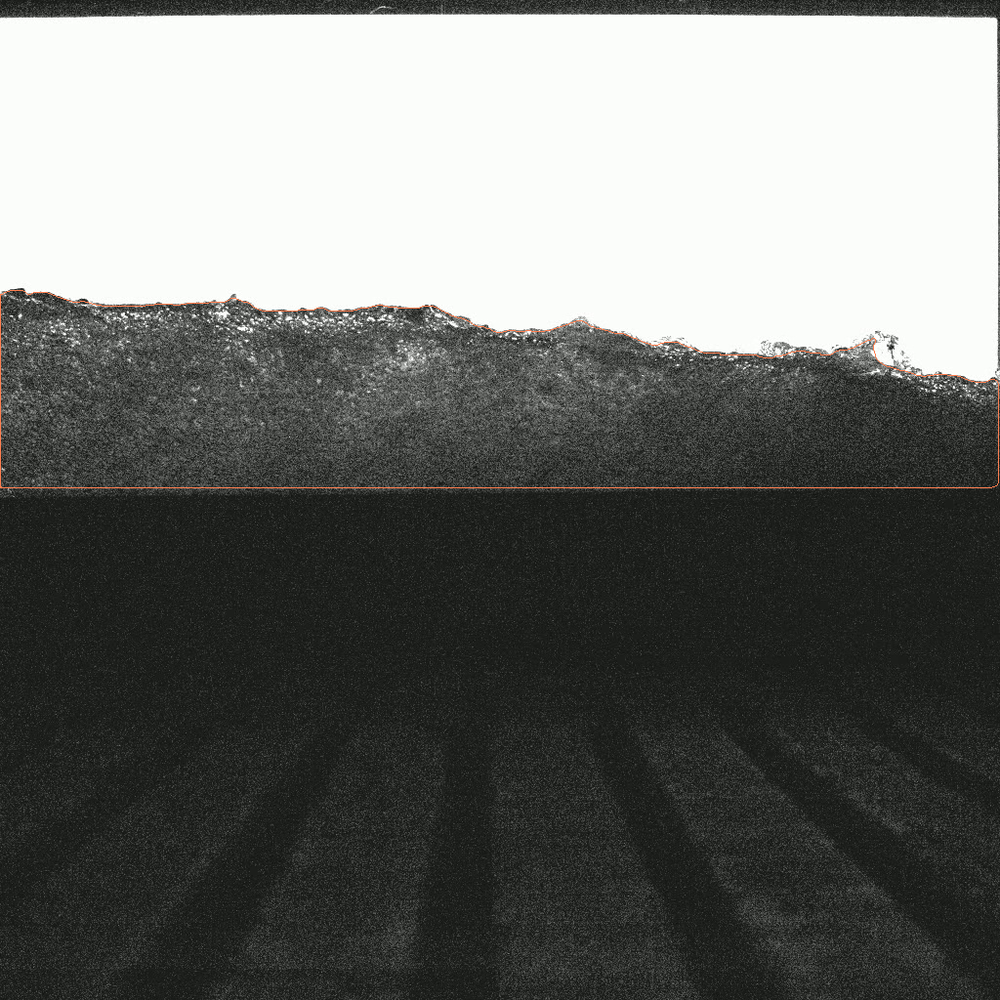

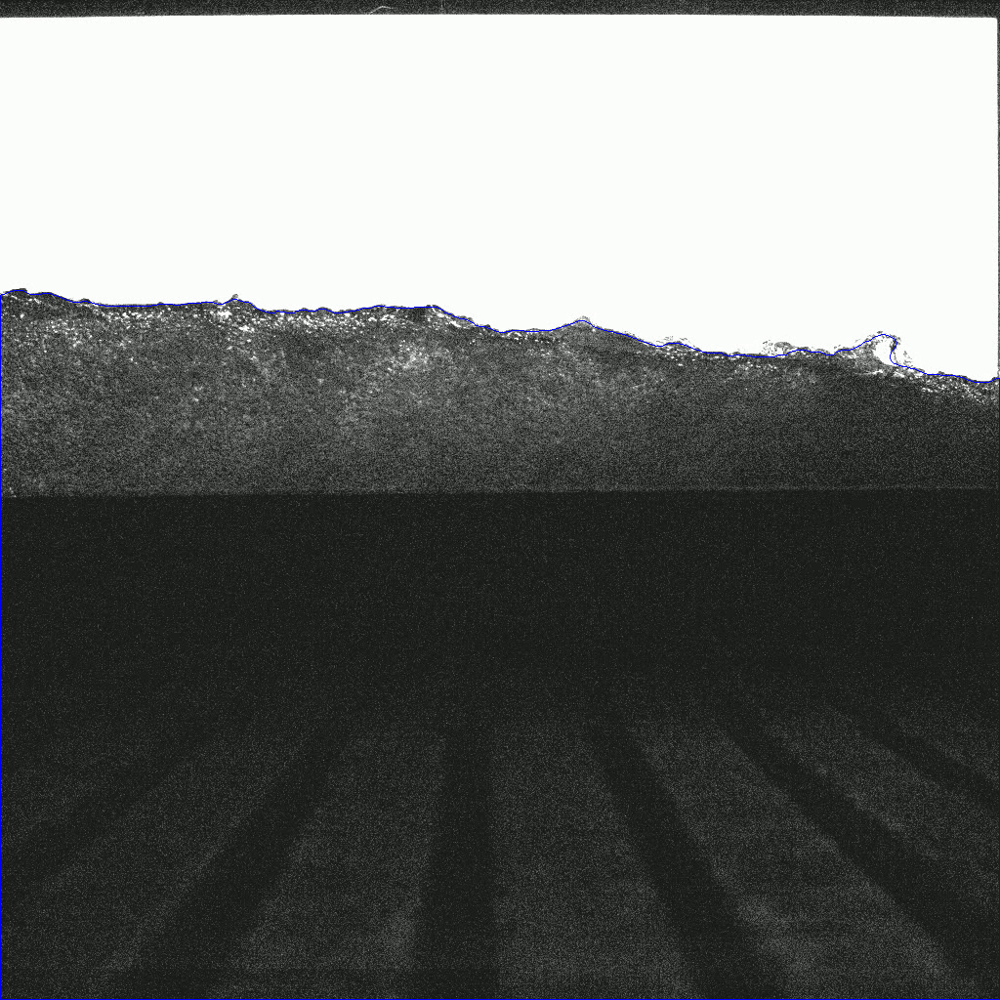

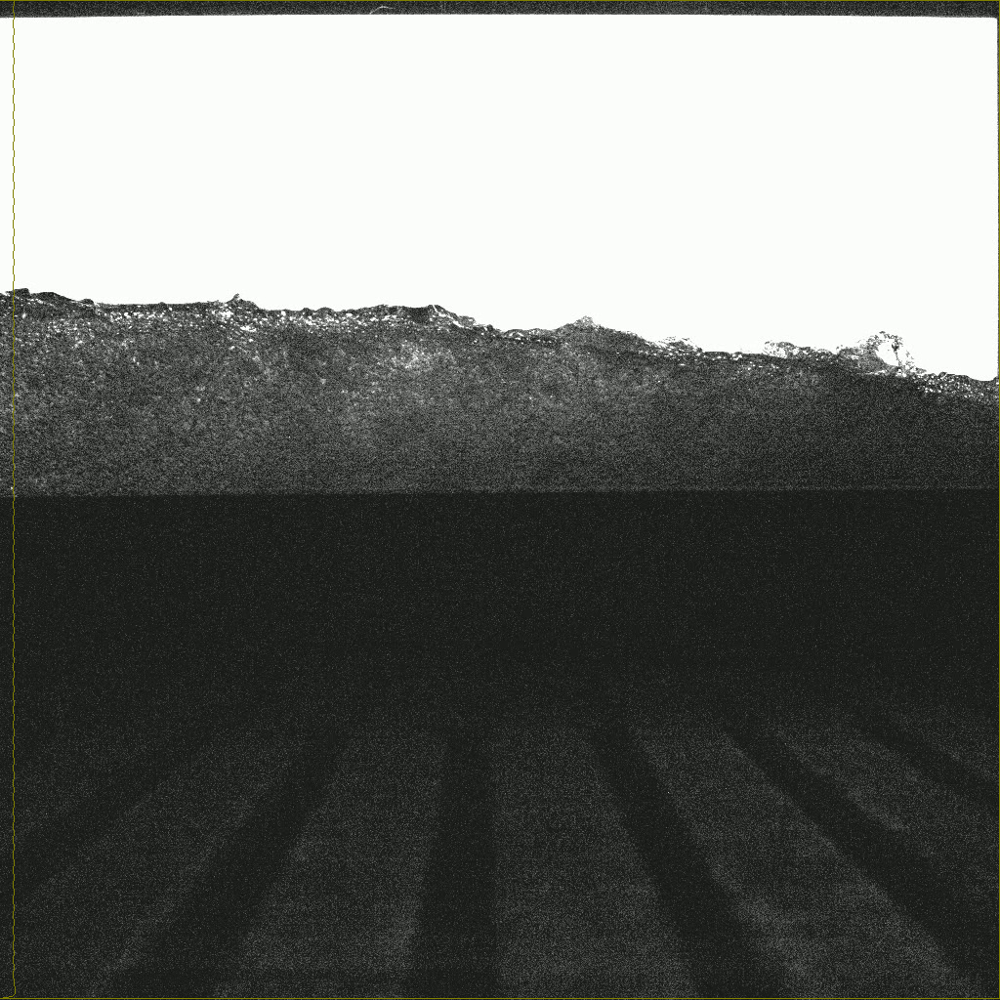

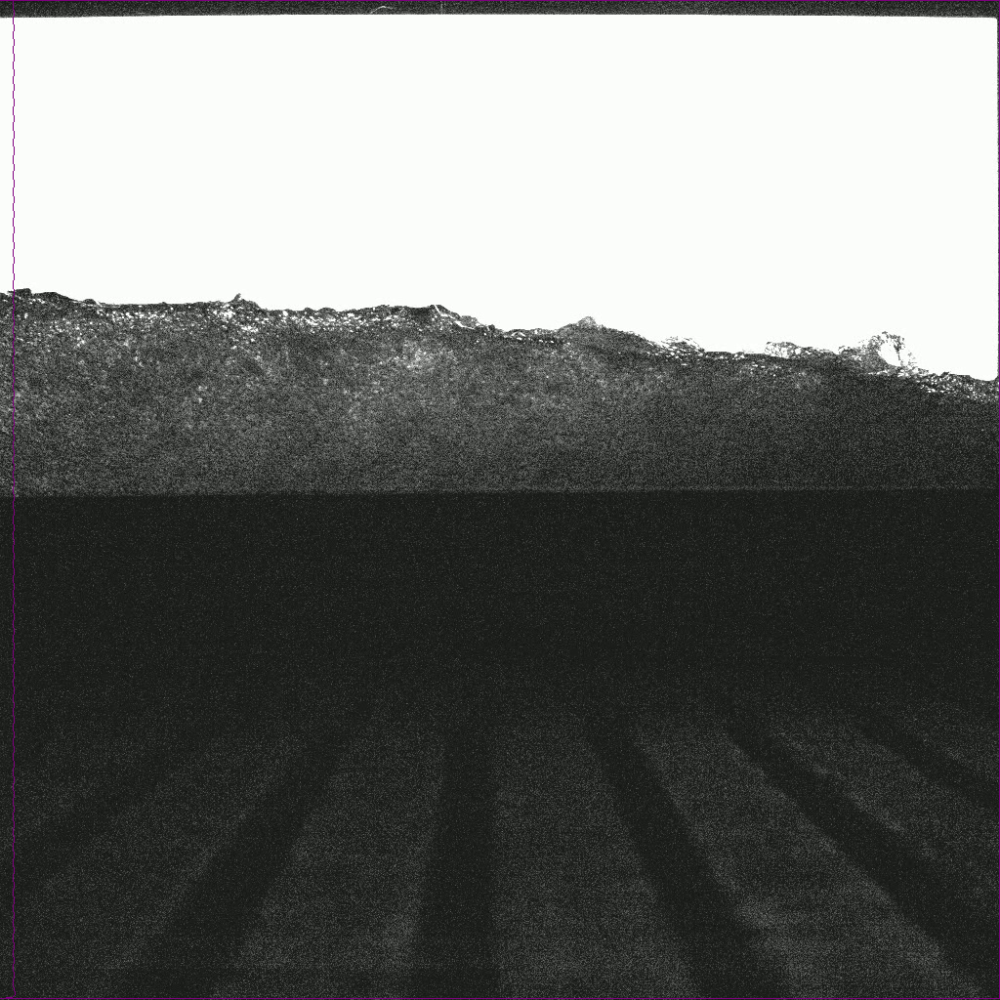

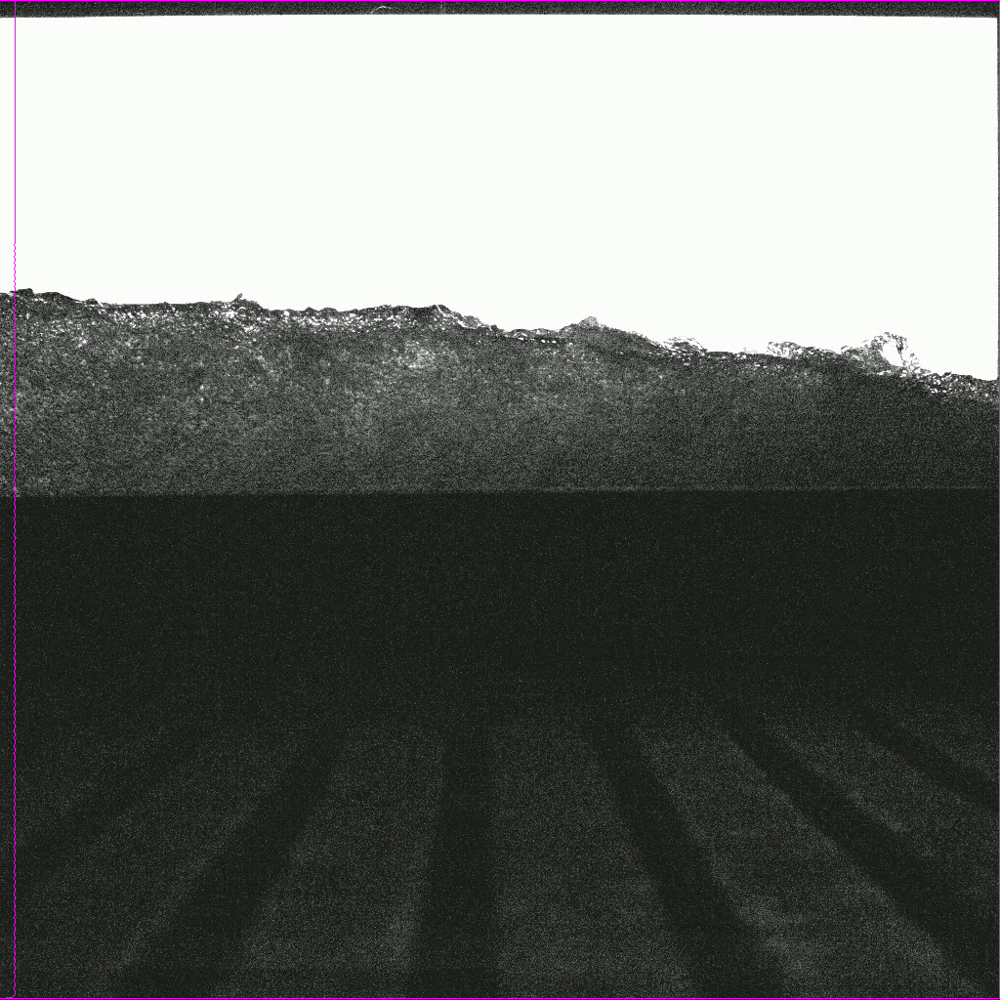

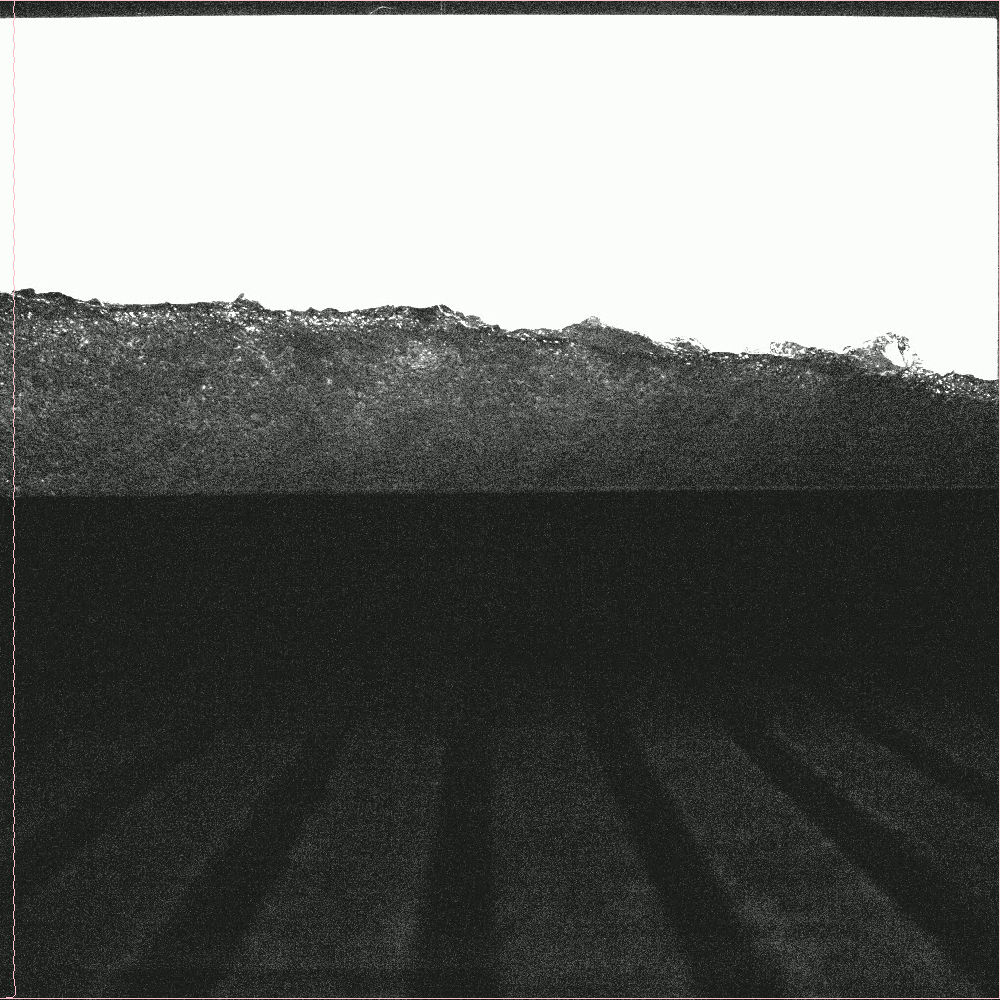

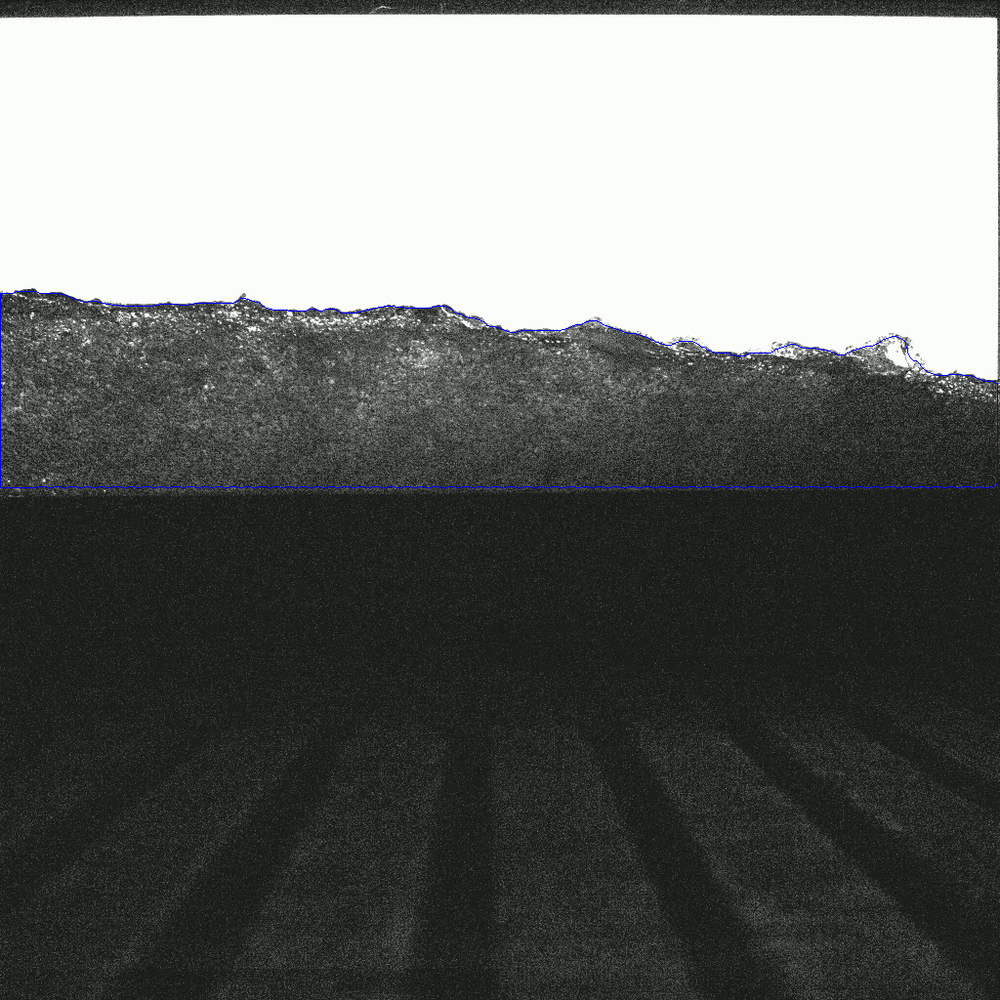

KeyboardInterrupt: 

In [14]:
total_frames = len(sorted(os.listdir(save_path)))
progress_bar = tqdm(total=total_frames, desc="Processing frames")

for i, frame in enumerate(sorted(os.listdir(save_path))): #Takes ±5 secs per frame for one set of parameters

    if '.ipynb_checkpoints' in frame: #Skip the checkpoints
        continue

    image = Image.open(save_path + frame)
    image = image.convert('RGB')
    
    task_prompt = '<REFERRING_EXPRESSION_SEGMENTATION>'

    parameters = [[1024, 3]]#, [1024, 5], [1024, 1], [512, 3], [2048, 3]] #List of parameters to play with - max_tokens, num_beams

    for max_tokens, num_beams in parameters:
        results = run_example(task_prompt, max_tokens=max_tokens, num_beams=num_beams, text_input="wave contour")
        result_img = draw_polygons(image, results['<REFERRING_EXPRESSION_SEGMENTATION>'], save_path +
                                    'max_tokens_' + str(max_tokens) + '_num_beams_' + str(num_beams) + '_' + 'output_' + frame)
        
        # Only display first few images
        if i < 11:
            display(result_img) #Sometimes segmentation works, sometimes not
        
    progress_bar.update(1)

progress_bar.close()